In [1]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import zipfile

from PIL import Image
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import proj3d
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib import offsetbox

In [2]:
# load data
with zipfile.ZipFile("data/images.pkl.zip", 'r') as zip_ref:
    zip_ref.extractall("data/")
images = pickle.load(open("data/images.pkl", "rb"))
df = pd.read_pickle("data/data.pkl")
feature_size = 230
features = df.to_numpy()[:, :feature_size]

In [26]:
# PCA
pca = PCA(n_components=3)
pca_result = pca.fit_transform(features)
df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
df['pca-three'] = pca_result[:,2]

# TSNE
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(features)
df['tsne-3d-one'] = tsne_results[:,0]
df['tsne-3d-two'] = tsne_results[:,1]
df['tsne-3d-three'] = tsne_results[:,2]

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2500 samples in 0.002s...
[t-SNE] Computed neighbors for 2500 samples in 0.242s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2500
[t-SNE] Computed conditional probabilities for sample 2000 / 2500
[t-SNE] Computed conditional probabilities for sample 2500 / 2500
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 151.674500
[t-SNE] KL divergence after 300 iterations: 6.370078


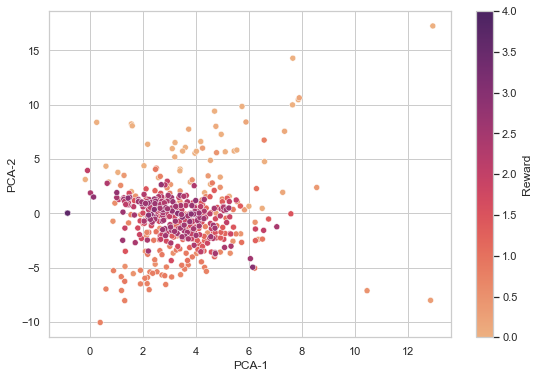

In [27]:
# 2D plot PCA
plt.figure(figsize=(9, 6))
sns.set(style='whitegrid')
sns.set_context("notebook")
norm = plt.Normalize(df['reward'].min(), df['reward'].max())
sm = plt.cm.ScalarMappable(cmap="flare", norm=norm)
sm.set_array([])

ax = sns.scatterplot(
    x='pca-one', 
    y='pca-two',
    hue='reward',
    palette=sns.color_palette('flare', as_cmap=True),
    data=df,
    legend=True,
    alpha=1
)
ax.get_legend().remove()
cbar = ax.figure.colorbar(sm)
cbar.set_label('Reward')
ax.set(xlabel='PCA-1', ylabel='PCA-2')
plt.show()

<ipython-input-33-3d287e5c2120>:3: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


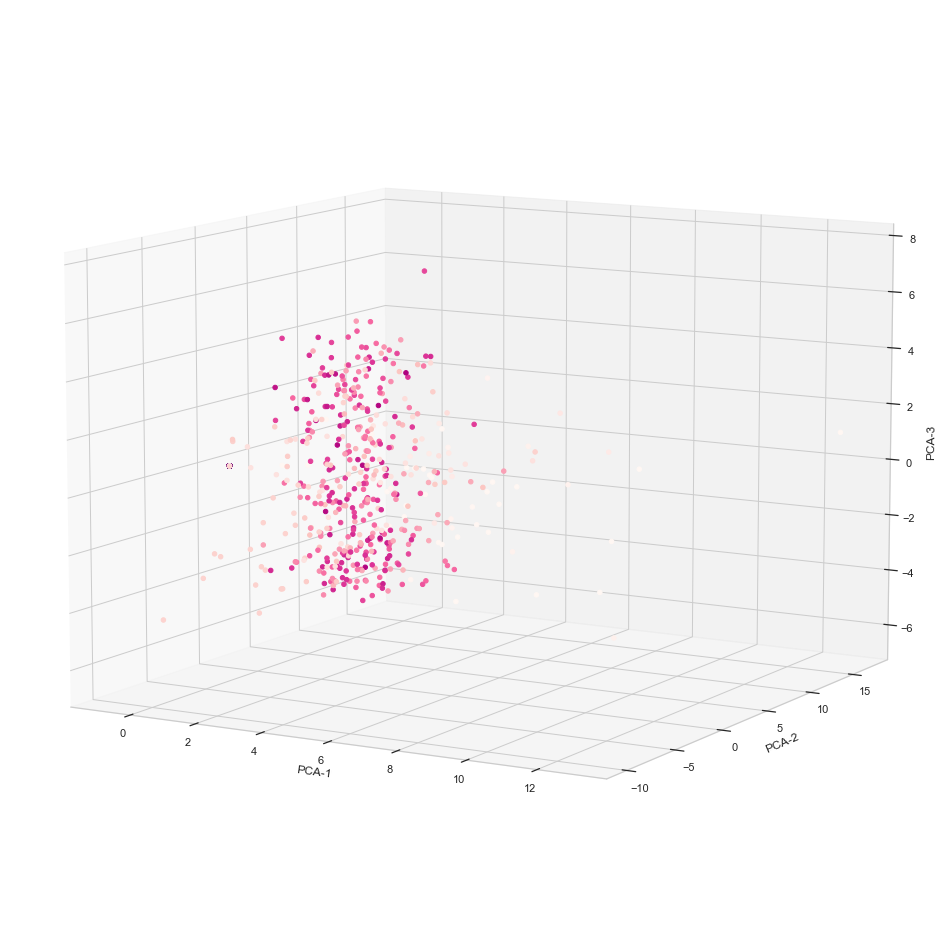

In [33]:
# 3D plot PCA
fig = plt.figure(figsize=(13, 13))
ax = Axes3D(fig)
ax.view_init(elev=10.)

ax.scatter(
    xs=df['pca-one'], 
    ys=df['pca-two'], 
    zs=df['pca-three'], 
    c=df['reward'],
    cmap='RdPu',
    alpha=1
)
ax.set_xlabel('PCA-1')
ax.set_ylabel('PCA-2')
ax.set_zlabel('PCA-3')

def animate(i):
    ax.view_init(elev=10., azim=i)
    return fig

plt.show()
plt.close()
anim = animation.FuncAnimation(fig, animate, frames=360, interval=40)
html = anim.to_html5_video()
HTML(html)

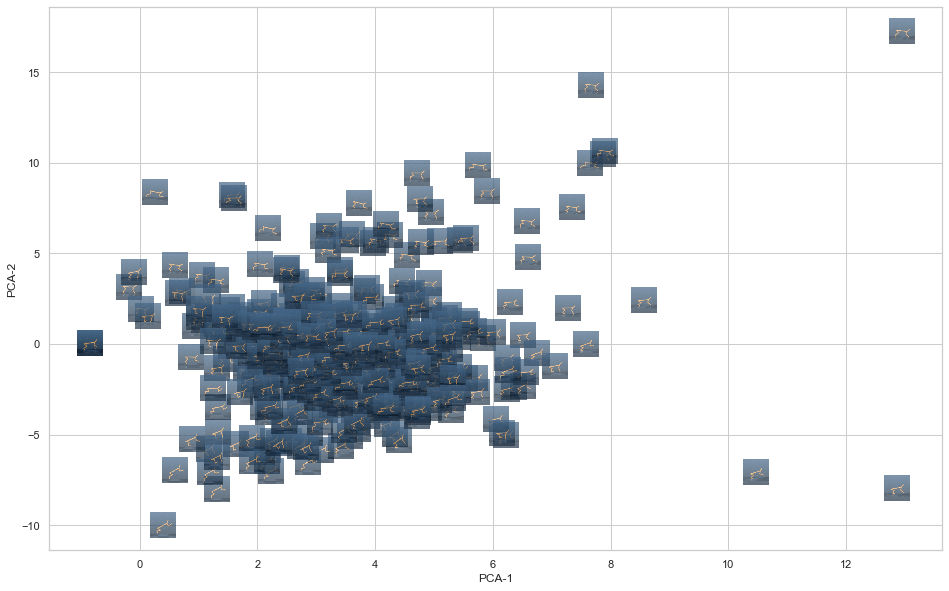

In [41]:
# 2D plot PCA images
fig, ax = plt.subplots(figsize=(16, 10))
ax.scatter(
    x=df['pca-one'], 
    y=df['pca-two'], 
    c=df['reward'],
    cmap='tab10',
    alpha=0,
    marker='o'
)
ax.set(xlabel='PCA-1', ylabel='PCA-2')

for xy, i in zip(pca_result[:, :2], images):
    x0, y0 = xy
    i = np.concatenate((i, np.ones((1, 64, 64))), axis=0)
    i[3] = 0.7
    i = np.moveaxis(np.uint8(i * 255), 0, -1)
    i = Image.fromarray(i).convert('RGBA')
    img = OffsetImage(i, zoom=0.4)
    ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
    ax.add_artist(ab)
    
plt.show()

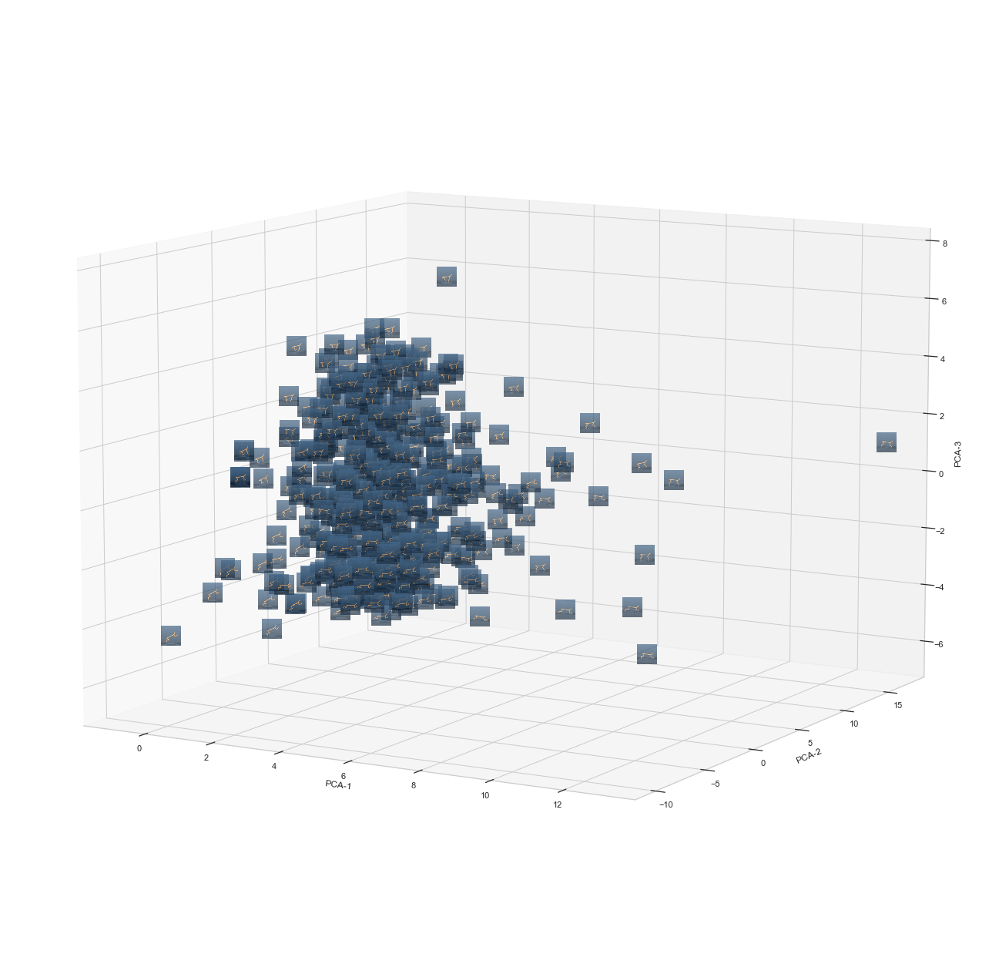

In [45]:
# 3D plot PCA images
fig = plt.figure(figsize=(23, 23))
ax = fig.add_subplot(111, projection=Axes3D.name)
ax.view_init(elev=10.)

ax.scatter(
    xs=df['pca-one'], 
    ys=df['pca-two'],
    zs=df['pca-three'],
    c=df['label'],
    cmap='tab10',
    alpha=0,
    marker='o'
)

# Create a dummy axes to place annotations to
ax2 = fig.add_subplot(111, frame_on=False) 
ax2.axis('off')
ax2.axis([0, 1, 0, 1])


def proj(X):
    x, y, z = X
    x2, y2, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
    tr = ax.transData.transform((x2, y2))
    return ax2.transData.inverted().transform(tr)

def image(arr, xy):
    arr = np.concatenate((arr, np.ones((1, 64, 64))), axis=0)
    arr[3] = 0.7
    arr = np.moveaxis(np.uint8(arr * 255), 0, -1)
    arr = Image.fromarray(arr).convert('RGBA')
    im = offsetbox.OffsetImage(arr, zoom=0.4)
    im.image.axes = ax
    ab = offsetbox.AnnotationBbox(im, xy, xycoords='data', boxcoords='offset points', frameon=False)
    ax2.add_artist(ab)
    return ab

ax.set_xlabel('PCA-1')
ax.set_ylabel('PCA-2')
ax.set_zlabel('PCA-3')

annot = []
for s, im in zip(pca_result, images):
    x, y = proj(s)
    annot.append(image(im,[x, y]))

def animate(i):
    ax.view_init(elev=10., azim=i)
    for s,ab in zip(pca_result, annot):
        ab.xy = proj(s)
    return fig

plt.show()
plt.close()
anim = animation.FuncAnimation(fig, animate, frames=360, interval=40)
html = anim.to_html5_video()
HTML(html)